# Project 5

General Overview of Step:
 - Import all data
 - Use HoG and Color Space to derive features
 - Use sliding window search to locate vehicles
 - Use heatmapping to determine false positives
 - Draw bounding boxes on positive detections in the video stream

Step 1: Make a list of images to read in and divide into vehicle and non-vehicle images

In [1]:
import os
import glob
# locate vehicle images
basedir = 'vehicles/'
image_types = os.listdir(basedir)
cars=[]
for imtype in image_types:
    cars.extend(glob.glob(basedir + imtype + '/*'))  
print('Number of Vehicle Images found:', len(cars))
with open('cars.txt', 'w') as f:
    for fn in cars:
        f.write(fn+'\n')
               
# Do the same thing for the non-vehicle images
basedir = 'non-vehicles/'
image_types= os.listdir(basedir)
notcars=[]
for imtype in image_types:
    notcars.extend(glob.glob(basedir + imtype + '/*'))
print('Number of Non-Vehicle Images found:', len(notcars))
with open('cars.txt', 'w') as f:
    for fn in notcars:
        f.write(fn+'\n')



Number of Vehicle Images found: 8792
Number of Non-Vehicle Images found: 8968


Step 2: Import all necessary packages

In [2]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import scipy
import pandas
import matplotlib
import cv2
import time
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

Step 3: Define function to return the HOG features and visualization

In [3]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                     vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_images = hog(img, orientations=orient, 
                                   pixels_per_cell=(pix_per_cell, pix_per_cell),
                                   cells_per_block=(cell_per_block, cell_per_block),
                                   transform_sqrt=False,
                                   visualise=vis, feature_vector= feature_vec)
        return features, hog_images
    # Otherwise call with one output
    else:
        features = hog(img, orientations=orient, 
                        pixels_per_cell=(pix_per_cell, pix_per_cell),
                        cells_per_block=(cell_per_block, cell_per_block),
                        transform_sqrt=False,
                        visualise=vis, feature_vector= feature_vec)
        return features
    
                            

Step 4: Define a function to computer binned color features

In [4]:
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

Step 5: Definie a function to computer histogram features

In [5]:
def color_hist(img, nbins=32):
    # Computer the histograms of the color channels seperately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concentrate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

Step 6: Define a function to extract features from a list of images

In [6]:
def extract_features(imgs, color_space='RGB', spatial_size=(32,32), 
                     hist_bins=32, orient=9,
                     pix_per_cell=8, cell_per_block=2, hog_channel=0,
                     spatial_feat=True, hist_feat=True, hog_feat=True):
    #Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each image one by one
        image = mpimg.imread(file)
        # appl color conversion if other than RGB
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)
            
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:, :, channel],
                                        orient, pix_per_cell, cell_per_block,
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:, :, hog_channel], orient, 
                                pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feautre vector to the feature list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return a list of feature vectors
    return features
    

Step 7: Define a function that creates the sliding window search

In [7]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None],
                xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of wondow in x/y
    nx_windows = np.int(xspan/nx_pix_per_step) - 1
    ny_windows = np.int(yspan/ny_pix_per_step) - 1
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate the window positions
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append the window positions to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list
            
    

Step 8: Define a function to draw bounding boxes

In [8]:
def draw_boxes(img, bboxes, color=(0,0,225), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

Step 9: Define a function to extract features from a single image window

In [9]:
def single_img_features(img, color_space='RGB', spatial_size=(32,32), 
                     hist_bins=32, orient=9,
                     pix_per_cell=8, cell_per_block=2, hog_channel=0,
                     spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):
    # 1) Define an empty list to receive features
    img_features = []
    # 2) Apply color conversions if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)
    # 3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        # 4) Append features to list
        img_features.append(spatial_features)
    # 5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    # 7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.append(get_hog_features(feature_image[:, :, channel],
                                    orient, pix_per_cell, cell_per_block,
                                    vis=False, feature_vec=True))
            hog_features = np.concatenate(hog_features)
        else:
            if vis == True:
                hog_features, hog_images = get_hog_features(feature_image[:, :, hog_channel], orient, 
                                pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:, :, hog_channel], orient, 
                                pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        # 8) Append features to list
        img_features.append(hog_features)
    
    # 9) Return concatenated array of features
    if vis == True:
        return np.concatenate(img_features), hog_images
    else:
        return np.concatenate(img_features)
    

Step 10: Define a function to search an image based on list of windows

In [10]:
def search_windows(img, windows, clf, scaler, color_space='RGB',
                 spatial_size=(32, 32), hist_bins=32,
                 hist_range=(0,256), orient=9,
                 pix_per_cell=8, cell_per_block=2,
                 hog_channel=0, spatial_feat=True,
                 hist_feat=True, hog_feat=True):
    # 1) Create an empty list to receive positive detection windows
    on_windows = []
    # 2) Iterate over all windows in the list
    for window in windows:
        # 3) Extract the test window from the original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64,64))
        # 4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                                      spatial_size=spatial_size, hist_bins=hist_bins,
                                      orient=orient, pix_per_cell=pix_per_cell,
                                      cell_per_block=cell_per_block,
                                      hog_channel=hog_channel, spatial_feat=spatial_feat,
                                      hist_feat=hist_feat, hog_feat=hog_feat)
        # 5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        # 6) Predict using your classifier
        prediction = clf.predict(test_features)
        # 7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8 Return windows for positive detections
    return on_windows

Step 11: Define a function for plotting multiple images

In [11]:
def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])
            

Step 12: Test pipeline on car and noncar images 

//anaconda/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


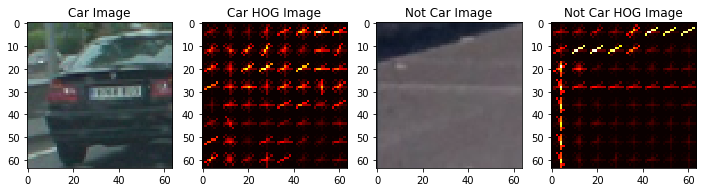

In [12]:
%matplotlib inline
# Choose random car / not-car indices
car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

# Read in car / not-car images
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

# Define feature parameters
color_space = 'RGB' # can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 6
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0 # Can be 0, 1, 2, or 'ALL'
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16 # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                                                 hist_bins=hist_bins, orient=orient,
                                                 pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                                                 spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)
notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size,
                                                 hist_bins=hist_bins, orient=orient,
                                                 pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                                                 spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)
images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['Car Image', 'Car HOG Image', 'Not Car Image', 'Not Car HOG Image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)



Step 13: Train a classifier

In [14]:
# Define feature parameters
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL' # Can be 0, 1, 2, or 'ALL'
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16 # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

t=time.time()
n_samples = 1000
random_idxs = np.random.randint(0, len(cars), n_samples)
test_cars = cars #np.array(cars)[random_idxs] #cars #entire dataset
test_notcars = notcars #np.array(notcars)[random_idxs] #notcars #entire dataset

car_features = extract_features(test_cars, color_space=color_space, 
                                            spatial_size=spatial_size, hist_bins=hist_bins, 
                                            orient=orient, pix_per_cell=pix_per_cell, 
                                            cell_per_block=cell_per_block, 
                                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                            hist_feat=hist_feat, hog_feat=hog_feat)

notcar_features = extract_features(test_notcars, color_space=color_space, 
                                            spatial_size=spatial_size, hist_bins=hist_bins, 
                                            orient=orient, pix_per_cell=pix_per_cell, 
                                            cell_per_block=cell_per_block, 
                                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                            hist_feat=hist_feat, hog_feat=hog_feat)

print(time.time()-t, 'Seconds to compute features...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0,100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.1, random_state=rand_state)

print('Using: ', orient, 'orientations, ', pix_per_cell, 
      'pixels per cell, ', cell_per_block, 'cells per block, ',
     hist_bins, 'histogram bins, and ', spatial_size,'spatial sampling')
print('Feature vector length:', len(X_train[0]))

# Use a linear SVC
svc = LinearSVC()
# Check the training time for the SVC
t=time.time()
svc.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))


//anaconda/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


203.18945908546448 Seconds to compute features...
Using:  9 orientations,  8 pixels per cell,  2 cells per block,  16 histogram bins, and  (16, 16) spatial sampling
Feature vector length: 6108
74.39 Seconds to train SVC...
Test Accuracy of SVC =  0.9899


Step 14: Test on example images (.jpgs)

0.0 1.0


//anaconda/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


1.4996578693389893 seconds to process one image searching 100 windows
0.0 1.0
0.8713932037353516 seconds to process one image searching 100 windows
0.0 1.0
0.7896041870117188 seconds to process one image searching 100 windows
0.0 1.0
0.7356350421905518 seconds to process one image searching 100 windows
0.0 1.0
0.7645888328552246 seconds to process one image searching 100 windows
0.0 1.0
0.769460916519165 seconds to process one image searching 100 windows


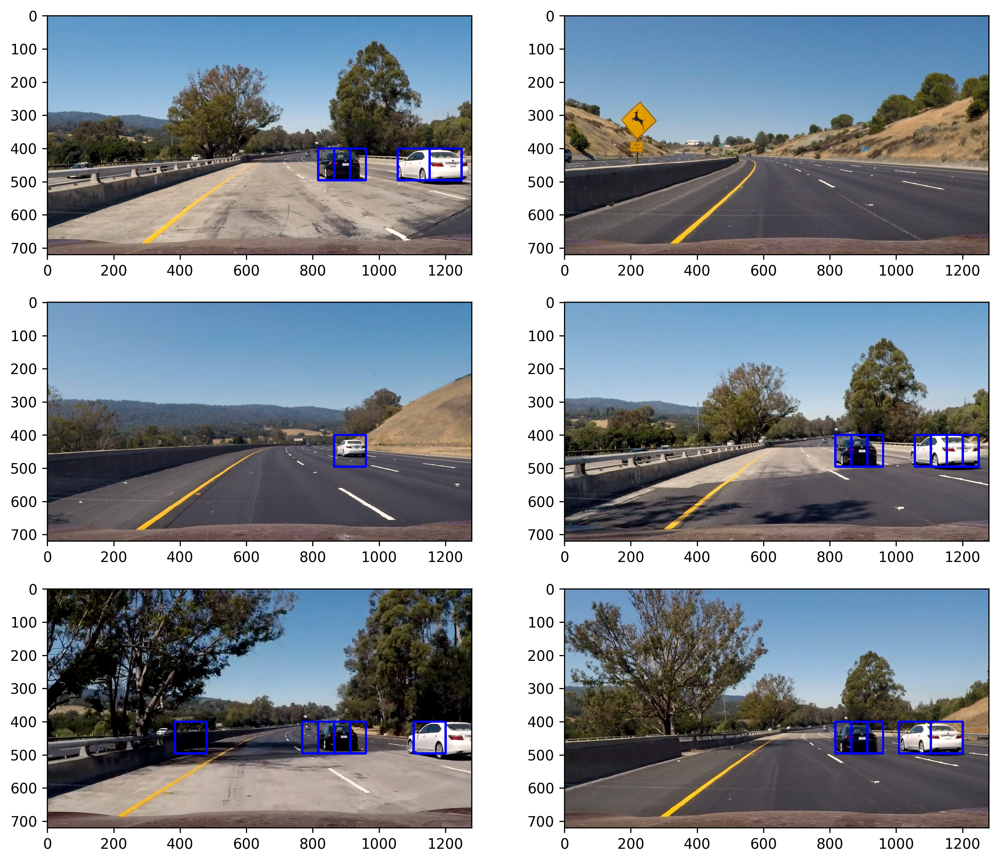

In [15]:
searchpath = 'test_images/*'
example_images = glob.glob(searchpath)
images = []
titles = []
y_start_stop = [400, 656]
overlap = 0.5
for img_src in example_images:
    t1= time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    print(np.min(img), np.max(img))
    
    #windows = slide_window(img,x_start_stop=[None, None], y_start_stop=y_start_stop,
    #                       xy_window=(64, 64), xy_overlap=(overlap, overlap))
    windows = slide_window(img,x_start_stop=[None, None], y_start_stop=y_start_stop,
                          xy_window=(96, 96), xy_overlap=(overlap, overlap))
    #windows = windows1 + windows2
    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space,
                                spatial_size=spatial_size, hist_bins=hist_bins,
                                orient=orient, pix_per_cell=pix_per_cell,
                                cell_per_block=cell_per_block,
                                hog_channel=hog_channel, spatial_feat=spatial_feat,
                                hist_feat=hist_feat, hog_feat=hog_feat)
    
    window_img = draw_boxes(draw_img, hot_windows, color=(0,0,255), thick=6)
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')

fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 5, 2, images, titles)


In [16]:
# Used to convert individual images
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YLUV)

//anaconda/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


0.7956700325012207 seconds to run, total windows =  294
0.6453678607940674 seconds to run, total windows =  294
0.5172600746154785 seconds to run, total windows =  294
0.522144079208374 seconds to run, total windows =  294
0.5061678886413574 seconds to run, total windows =  294
0.5061359405517578 seconds to run, total windows =  294


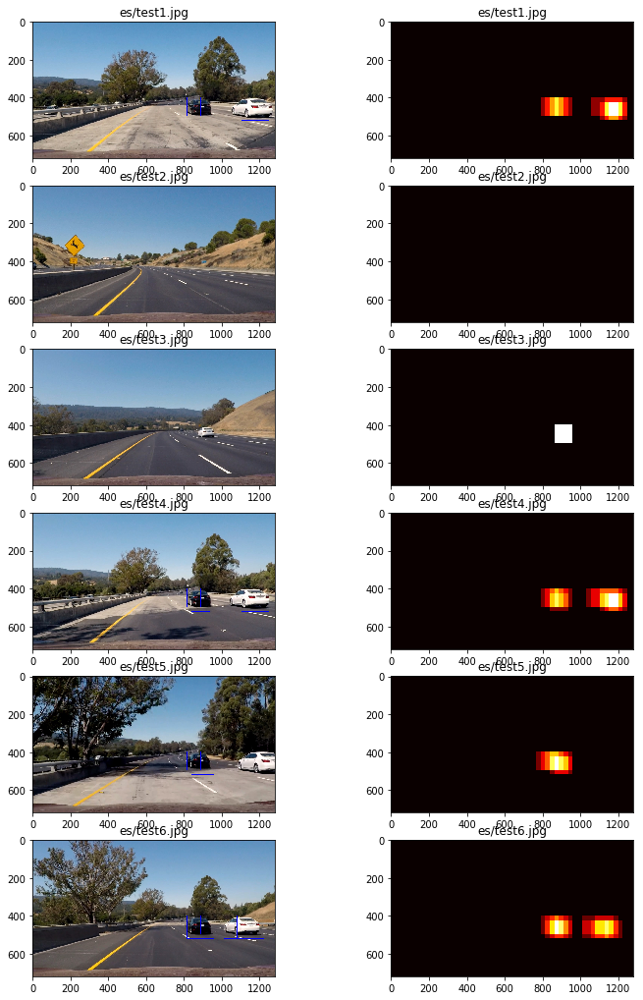

In [17]:
out_images = []
out_maps = []
out_titles = []
out_boxes = []
ystart = 400
ystop = 656
scale = 1.5 # rather than taking each window and downsizing to 64x64, just scale entire image
# Iterate over test iamges
for img_src in example_images:
    img_boxes = []
    t=time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    # Make a heatmap of zeros
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2 # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64, 64))
            
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img, (xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart), (0,0,255))
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                              
    print(time.time()-t, 'seconds to run, total windows = ', count)

    out_images.append(draw_img)
    out_titles.append(img_src[-12:])
    out_titles.append(img_src[-12:])
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)

fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

In [21]:
# Iterate over test images
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    bbox_list = []
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop, :, :]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
      
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2 # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64, 64))
            
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                bbox_list.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
    return bbox_list

# Here is your draw_boxes function from the previous exercise
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

In [22]:
from scipy.ndimage.measurements import label

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return threshold map
    return heatmap

//anaconda/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


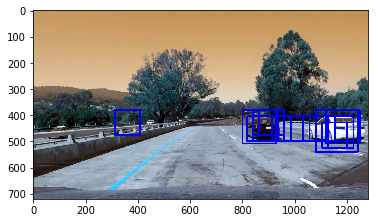

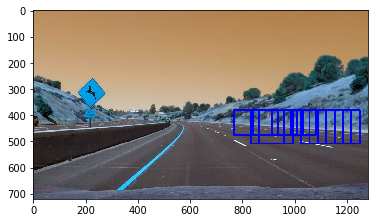

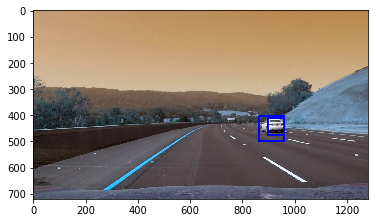

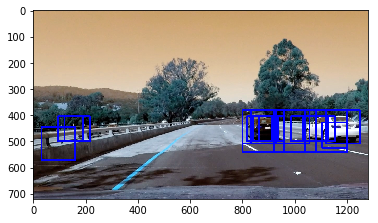

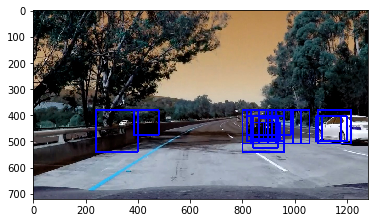

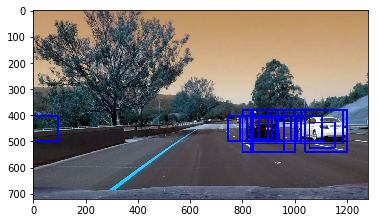

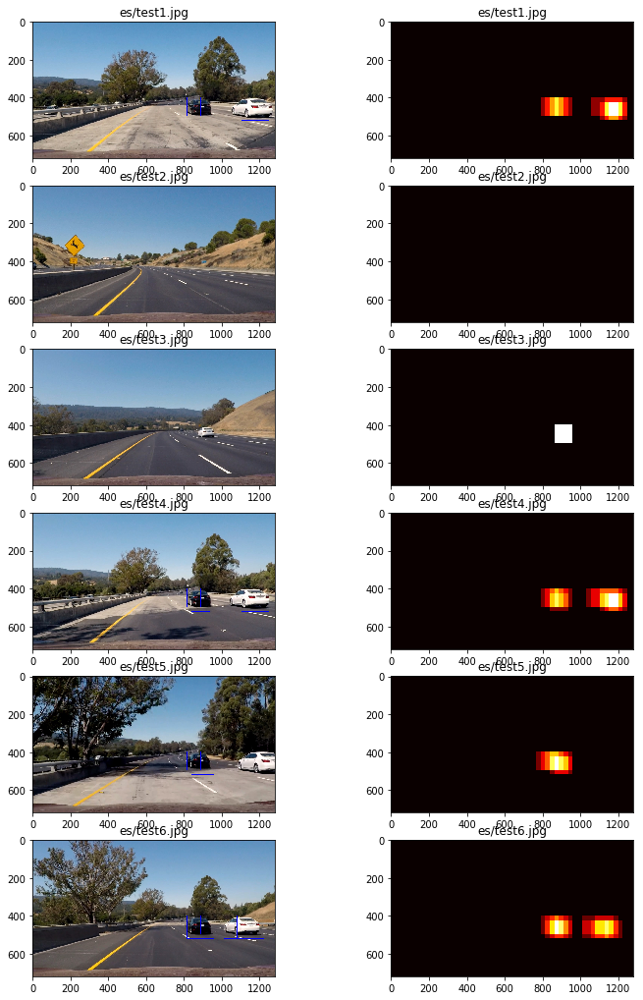

In [23]:
example_imgs = glob.glob("test_images/*.jpg")
ystart = 400
ystop = 656
scale = 1.5
# Iterate over test images
for img_src in example_imgs:
    bbox_list = []
    img = cv2.imread(img_src)
    bbox_list.append(find_cars(img, 380, 510, 1.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))
    bbox_list.append(find_cars(img, 380, 570, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))
    bbox_list.append(find_cars(img, 380, 630, 2.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))
    bbox_list.append(find_cars(img, 380, 690, 2.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))  
    
    #Need to flatten list of lists
    bbox_list = [item for sublist in bbox_list for item in sublist]   
    box_img = draw_boxes(img, bbox_list,color=(0, 0, 255), thick=6)
    fig = plt.figure()
    plt.imshow(box_img)

fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

Apply Heatmap Thresholding

//anaconda/lib/python3.5/site-packages/skimage/feature/_hog.py:119: skimage_deprecation: Default value of `block_norm`==`L1` is deprecated and will be changed to `L2-Hys` in v0.15
  'be changed to `L2-Hys` in v0.15', skimage_deprecation)


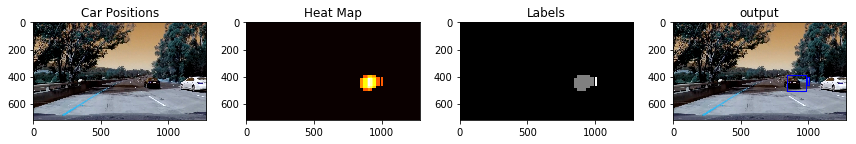

In [34]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
    # Return updated heatmap
    return heatmap
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

img = cv2.imread('./test_images/test5.jpg')
heat = np.zeros_like(img[:,:,0]).astype(np.float)
box_list = []
box_list.append(find_cars(img, 390, 510, 1.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))
box_list.append(find_cars(img, 390, 570, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))
box_list.append(find_cars(img, 390, 630, 2.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))
box_list.append(find_cars(img, 390, 690, 2.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))    
box_list = [item for sublist in box_list for item in sublist] 
heat = add_heat(heat,box_list)
heat = apply_threshold(heat,5)
heatmap = np.clip(heat, 0, 255)
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(img), labels)

fig = plt.figure(figsize=(12,24))
plt.subplot(141)
plt.imshow(img)
plt.title('Car Positions')
plt.subplot(142)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()
plt.subplot(143)
plt.imshow(labels[0], cmap='gray')
plt.title('Labels')
fig.tight_layout()
plt.subplot(144)
plt.imshow(draw_img)
plt.title('output')
fig.tight_layout()

In [35]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process(img):
    heat = np.zeros_like(img[:,:,0]).astype(np.float)
    # Apply find_cars() function and add positves to bounding boxes list
    box_list = []
    box_list.append(find_cars(img, 380, 500, 1.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))
    box_list.append(find_cars(img, 380, 570, 1.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))    
    box_list.append(find_cars(img, 380, 630, 2.0, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))
    box_list.append(find_cars(img, 380, 700, 2.5, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins))    
    box_list = [item for sublist in box_list for item in sublist] 
    heat = add_heat(heat,box_list)
    # Apply heatmap threshold
    heat = apply_threshold(heat,1)
    heatmap = np.clip(heat, 0, 255)
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img   

test_output = 'final_video_output.mp4'
clip = VideoFileClip('project_video.mp4')
test_clip = clip.fl_image(process)
test_clip.write_videofile(test_output, audio=False)

[MoviePy] >>>> Building video final_video_output.mp4
[MoviePy] Writing video final_video_output.mp4


100%|█████████▉| 1260/1261 [23:33<00:01,  1.13s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: final_video_output.mp4 



View The Output Video

In [36]:
HTML('''
<video width = '960' height='540' controls>
    <source src='{0}'>
</video>
'''.format(test_output))
